In [2]:
from datasets.load import load_images
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

%matplotlib inline
plt.rcParams['figure.figsize'] = (15., 12.) # set default size of plots
#plt.rcParams['image.interpolation'] = 'nearest'
#plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2

In [8]:
plt.rcParams['figure.figsize'] = (15., 12.) # set default size of plots


In [4]:
samples = load_images('train', 'datasets')

[{'name': 'wenda', 'bounds': [[4343, 4303, 4428, 4447], [259, 4018, 444, 4458]]}, {'name': 'wizard', 'bounds': [[5866, 3911, 5935, 4006], [19, 3993, 199, 4458]]}, {'name': 'waldo', 'bounds': [[5368, 388, 5439, 557], [24, 463, 509, 1573], [659, 3998, 884, 4483]]}]


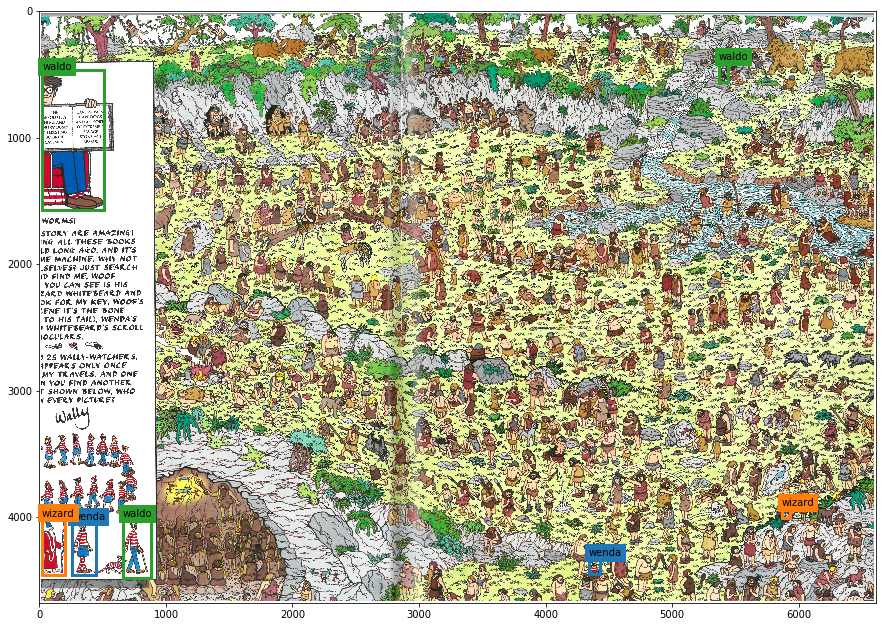

[{'name': 'waldo', 'bounds': [[1578, 593, 1615, 676], [601, 1334, 668, 1493], [588, 240, 653, 329]]}, {'name': 'wenda', 'bounds': [[455, 1334, 511, 1487]]}, {'name': 'wizard', 'bounds': [[342, 1334, 428, 1496]]}]


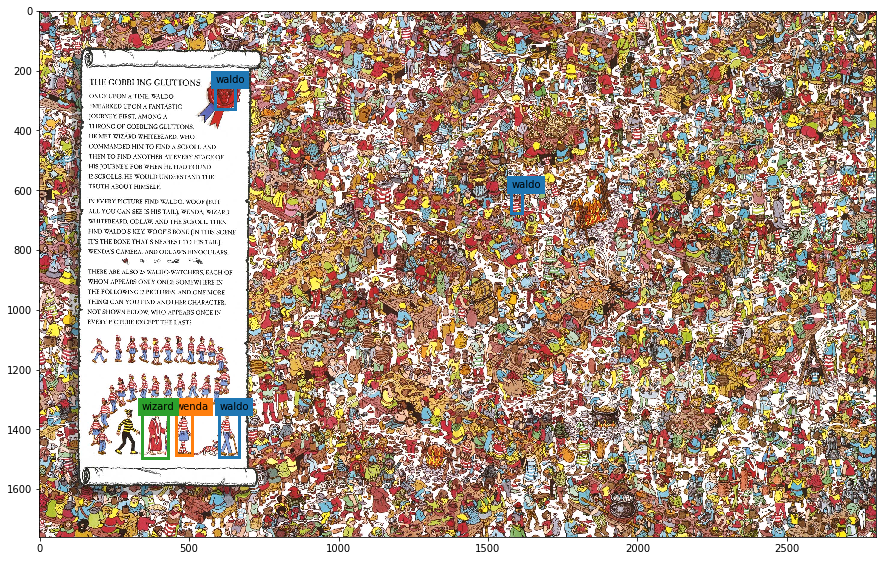

[{'name': 'waldo', 'bounds': [[827, 518, 896, 698]]}, {'name': 'wizard', 'bounds': [[789, 1455, 887, 1608]]}]


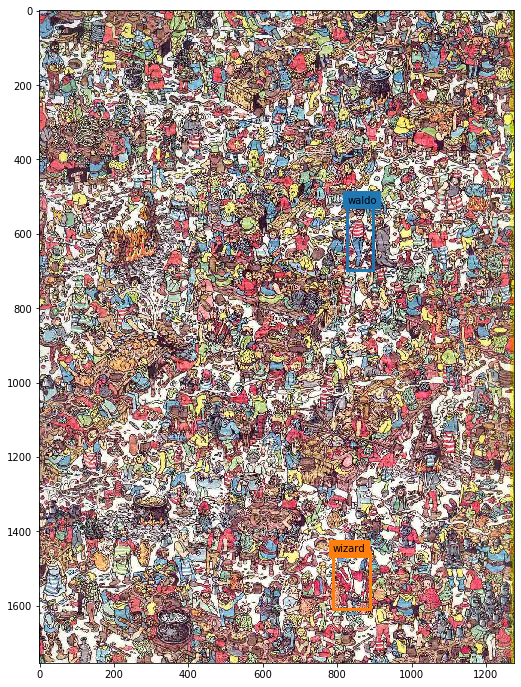

[{'name': 'waldo', 'bounds': [[964, 799, 1356, 1199]]}]


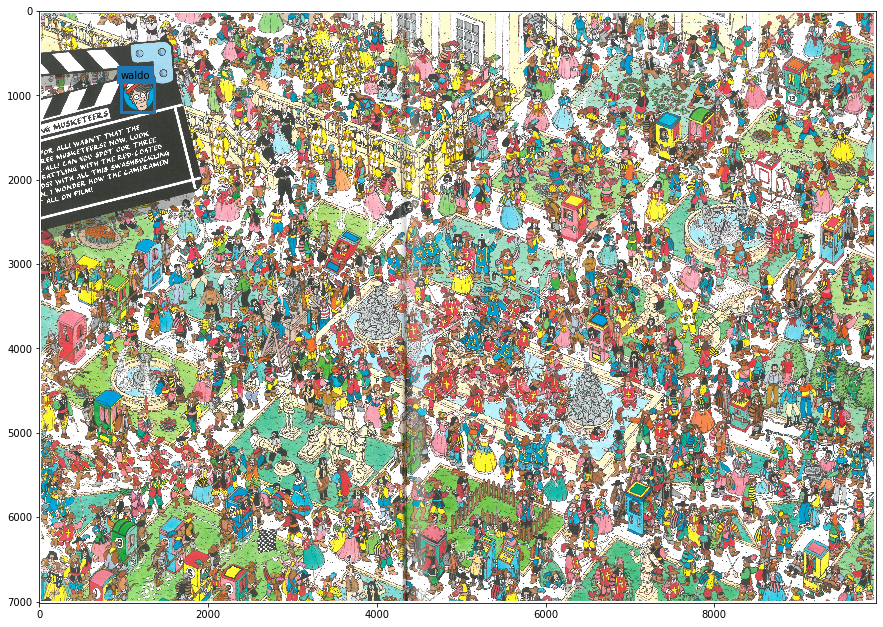

[{'name': 'wenda', 'bounds': [[378, 564, 394, 594]]}]


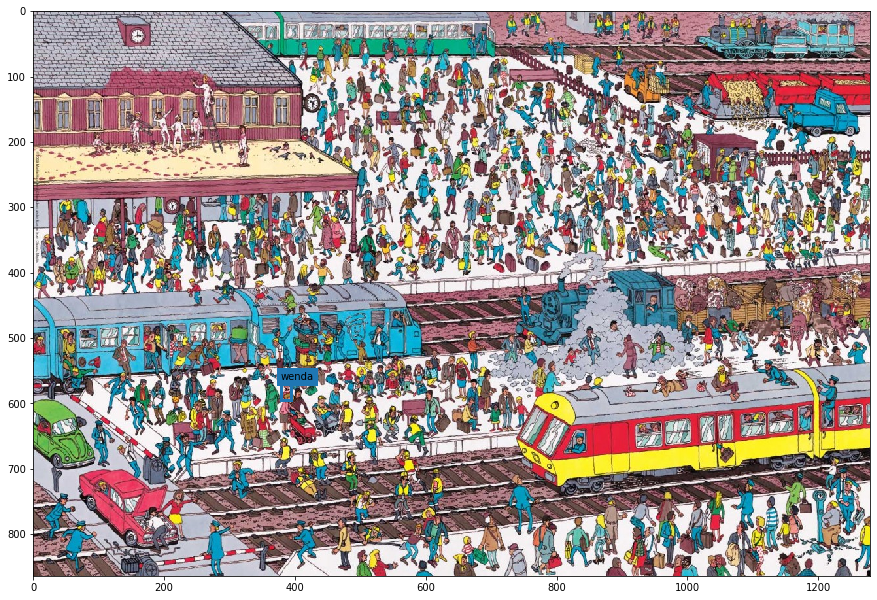

In [10]:
def draw_bbox(ax, name, box, col='r'):
    r = patches.Rectangle((box[0], box[1]), 
                          box[2] - box[0],
                          box[3] - box[1],
                          linewidth=3,
                          edgecolor=col,
                          facecolor='none')
    ax.add_patch(r)
    ax.text(box[0], box[1], name,
            bbox={'facecolor': col, 'linewidth': 0})

def draw_annotation(ax, classes):
    colors = plt.get_cmap('tab10')
    for idx, cl in enumerate(classes):
        col = colors(idx)
        for box in cl['bounds']:
            draw_bbox(ax, cl['name'], box, col)

for sample in np.random.choice(samples, 5, replace=False):
    fig, ax = plt.subplots(1)
    ax.imshow(sample['img'])
    print(sample['classes'])
    draw_annotation(ax, sample['classes'])
    plt.show()

In [11]:
import math
def generate_pos_samples(samples, blowup=1):
    res = []
    for sample in samples:
        for cl in sample['classes']:
            for box in cl['bounds']:
                scales = np.random.uniform(low=1, high=10, size=(blowup,))
                for s in scales:
                    try:
                        ymin, ymax = box[1], box[3]
                        xmin, xmax = box[0], box[2]
                        sx = math.ceil((ymax - ymin)*s/2)
                        sy = math.ceil((xmax - xmin)*s/2)
                        ymin, ymax = ymin - sy, ymax + sy
                        xmin, xmax = xmin - sy, xmax + sy
                        
                        img = sample['img'][ymin:ymax, xmin:xmax]
                        if img.size != 0:
                            #print(img)
                            res.append(dict(
                                name = cl['name'],
                                img = img,
                                scale = 1/s,
                                bbox = [box[0] - xmin,
                                        box[1] - ymin,
                                        box[2] - xmin,
                                        box[3] - ymin]                             
                            ))
                    except Exception as e:
                        print(e)
    np.random.shuffle(res)
    return res

pos_samples = generate_pos_samples(samples, 5)

num samples: 62
num scaled samples: 686


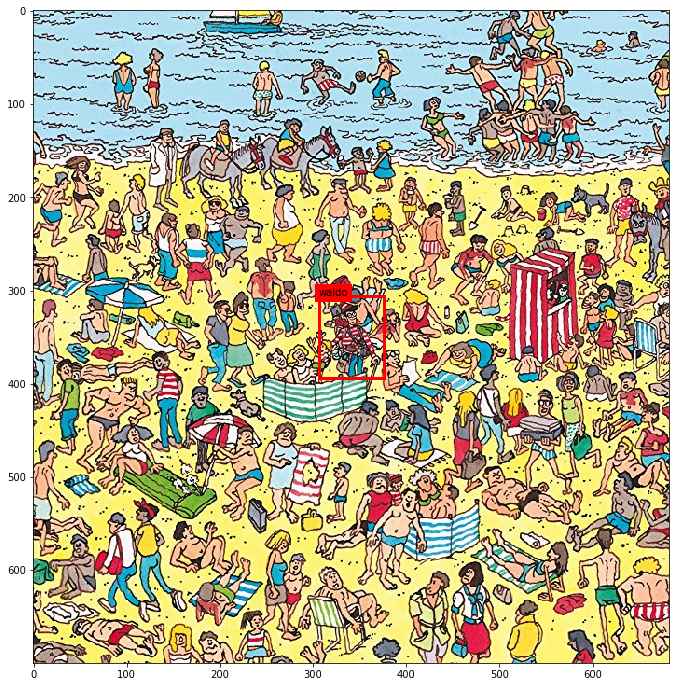

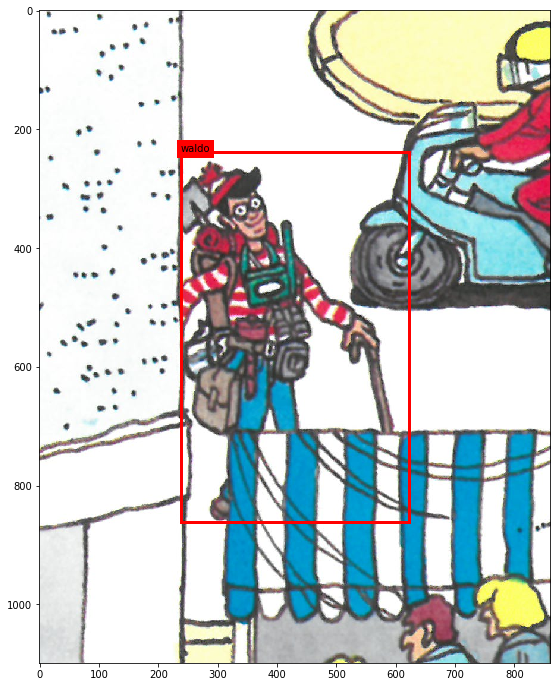

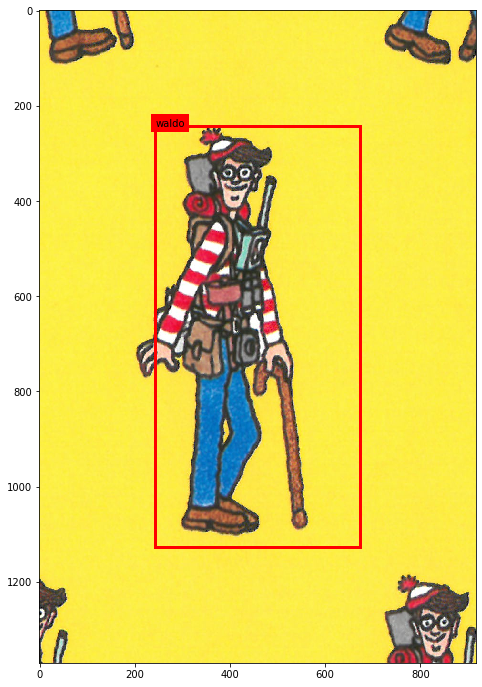

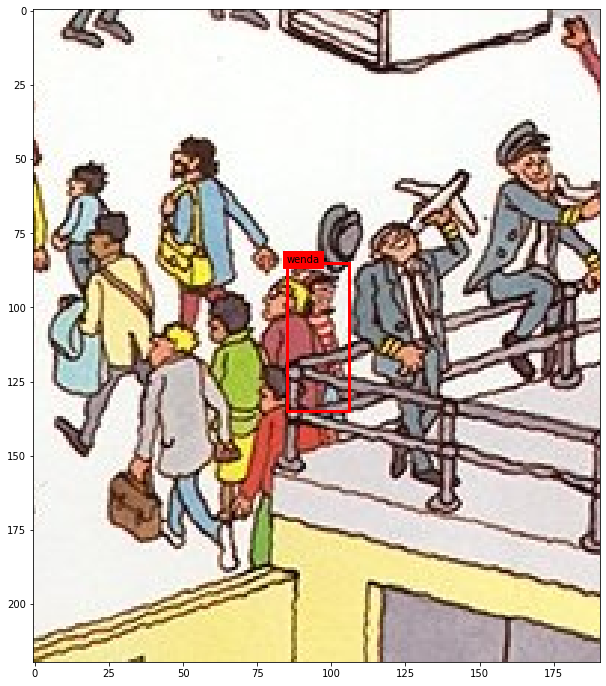

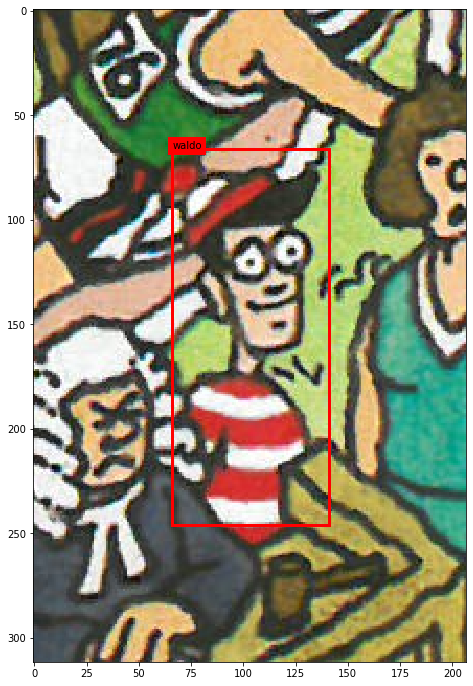

In [14]:
print('num samples: {}'.format(len(samples)))
print('num scaled samples: {}'.format(len(pos_samples)))


for idx, sample in enumerate(pos_samples[:5]):
    fig, ax = plt.subplots(1)
    plt.imshow(sample['img'])
    draw_bbox(ax, sample['name'], sample['bbox'])
    
plt.show()

## save first image sample
import pickle
with open('cache/waldo1.pkl', 'wb') as f:
    pickle.dump(pos_samples[0], f)